<a href="https://colab.research.google.com/github/jkim-01/MILDEC-Project/blob/main/Project_MILDEC.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Distinguishing Genuine Tanks from Inflatable Counterparts

For this project, we will be using `pytorch`,`fastbook`,`gradio`,`hugginface` as main packages.

*Attribution: Many of the codes and processes used in this project are replicated from [fastai_course](https://www.fast.ai/) taught by Jeremy Howard.*

### Step 0: Setting Up Envrionment

*Of note, as `GPU` is a requirement to run and test below codes, I created the notebook in google colab.*

In [1]:
#hide
! [ -e /content ] && pip install -Uqq fastbook
import fastbook
fastbook.setup_book()

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 719.8/719.8 kB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.7/7.7 MB 81.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 519.6/519.6 kB 31.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 58.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 15.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 18.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.0/302.0 kB 30.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.8/3.8 MB 115.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 91.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 86.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 295.0/295.0 kB 37.7 MB/s eta 0:00:00
Mounted at /content/gdrive


In [2]:
#hide
from fastbook import *
from fastai.vision.widgets import *

### Step 1: Create a Dataset

The `fastbook` package offers a convenient method for image searches. While it would be optimal to search for images using a major search engine such as `bing,` it necessitates an API key and the submission of credit card information (though the first 3000 images are provided for free). As an alternative, we'll use DuckDuckGo for our image searches.

In [3]:
# The below function allows to search image and download with key word
search_images_ddg

<function fastbook.search_images_ddg(term, max_images=200)>

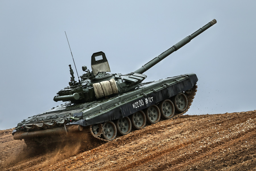

In [8]:
# The below image will be used to test the final model
urls = search_images_ddg('picture of military tank', max_images=1)
urls[0]

from fastdownload import download_url
dest = 'MilTank.jpg'
download_url(urls[0], dest, show_progress=False)

from fastai.vision.all import *
im = Image.open(dest)
im.to_thumb(256,256)

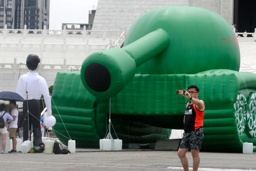

In [11]:
# Now search for an inflatable tank to used as a test data
download_url(search_images_ddg('picture inflatable tank', max_images=1)[0], 'InfTank.jpg', show_progress=False)
Image.open('InfTank.jpg').to_thumb(256,256)

In [33]:
# Now, let's download photos of each tank type
tank_types = 'inflatable','military'
path = Path('tanks')

from time import sleep

if not path.exists():
    path.mkdir()
    for o in tank_types:
        dest = (path/o)
        dest.mkdir(exist_ok=True)
        download_images(dest, urls=search_images_ddg(f'{o} tank photo'))
        sleep(10)  # Pause between searches to avoid over-loading server
        download_images(dest, urls=search_images_ddg(f'{o} tank sun photo'))
        sleep(10)
        download_images(dest, urls=search_images_ddg(f'{o} tank shade photo'))

### Step 2: Data Cleaning

Let's first check if any of the downloaded images are corrupted

In [34]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink)
len(failed)

43

There are 43 failed images in the folder, which are removed.

Then we will access the folder and manually delete any photos that don't belong to the folders.

For example, below image was inside the inflatable tank folder.

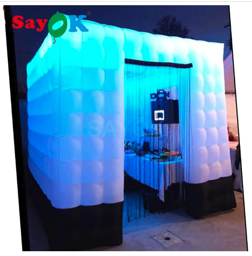

In [35]:
Image.open('wrong_image.png').to_thumb(256,256)

### Step 3: Data Preprocessing

To train a model, we'll need DataLoaders, which is an object that contains a training set (the images used to create a model) and a validation set (the images used to check the accuracy of a model -- not used during training). In fastai we can create that easily using a DataBlock, and view sample images from it:

In [39]:
tanks = DataBlock(
    blocks=(ImageBlock, CategoryBlock), #splitting dataset into independent and dependent variable
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42), #splitting dataset into train and test
    get_y=parent_label, #lableing
    item_tfms= Resize(128))

In [40]:
dls = tanks.dataloaders(path)

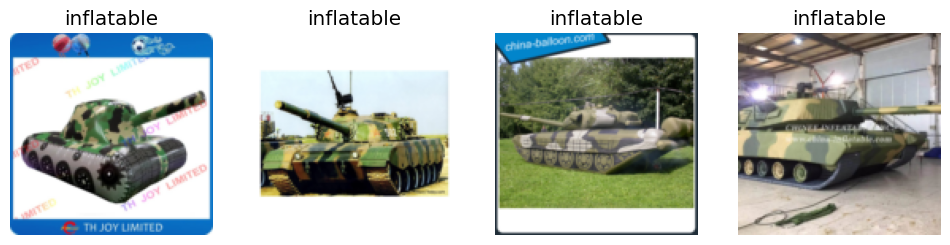

In [41]:
dls.valid.show_batch(max_n=4, nrows=1)

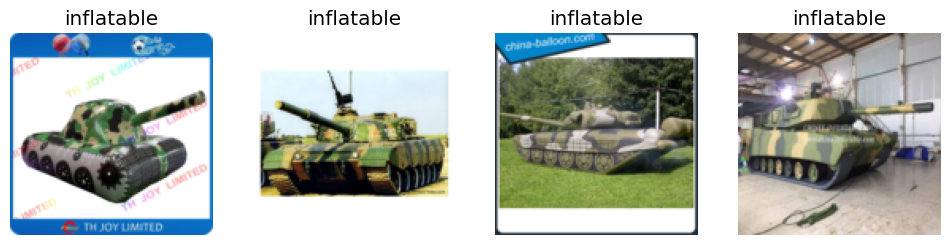

In [42]:
tanks = tanks.new(item_tfms=Resize(128, ResizeMethod.Squish))
dls = tanks.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

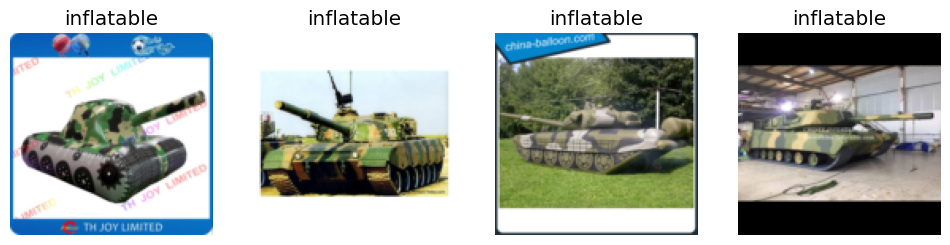

In [43]:
tanks = tanks.new(item_tfms=Resize(128, ResizeMethod.Pad, pad_mode='zeros'))
dls = tanks.dataloaders(path)
dls.valid.show_batch(max_n=4, nrows=1)

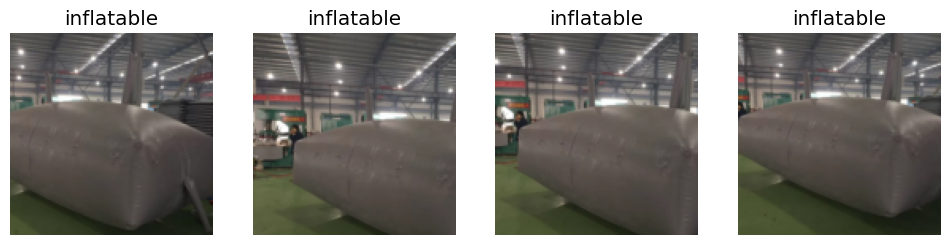

In [44]:
tanks = tanks.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = tanks.dataloaders(path)
dls.train.show_batch(max_n=4, nrows=1, unique=True)

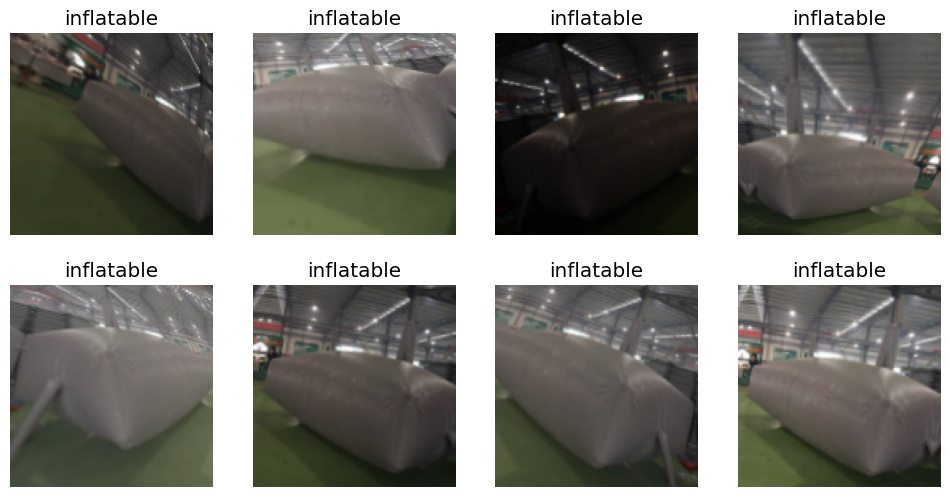

In [45]:
tanks = tanks.new(item_tfms=Resize(128), batch_tfms=aug_transforms(mult=2))
dls = tanks.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

### Step 4: Fine Tuning Existing Models

We are going to test three existing models to perfrom this task. To identify we will look at what models are available and their accuracy and computational requirement. (reference [here](https://www.kaggle.com/code/jhoward/which-image-models-are-best))

We will first start with computationally faster but less accurate image trained model `resnet18`

In [47]:
learn = vision_learner(dls, resnet18, metrics=error_rate)
learn.fine_tune(5)

epoch,train_loss,valid_loss,error_rate,time
0,0.973918,0.445495,0.146119,00:35


epoch,train_loss,valid_loss,error_rate,time
0,0.541694,0.293406,0.105023,00:33
1,0.483298,0.223896,0.091324,00:28
2,0.422801,0.180808,0.068493,00:35
3,0.364848,0.229960,0.082192,00:41
4,0.324501,0.234752,0.073059,00:31


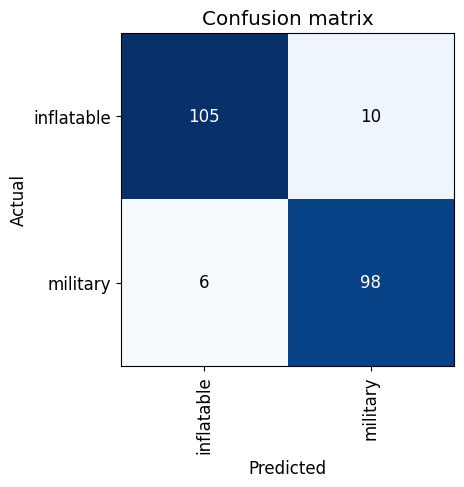

In [49]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

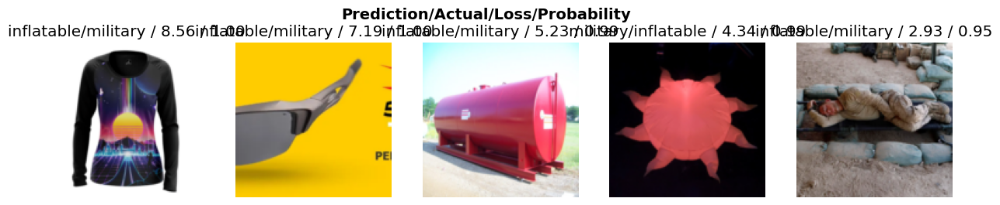

In [50]:
interp.plot_top_losses(5, nrows=1)

In [51]:
#hide_output
cleaner = ImageClassifierCleaner(learn)
cleaner

In [52]:
#hide
# for idx in cleaner.delete(): cleaner.fns[idx].unlink()
# for idx,cat in cleaner.change(): shutil.move(str(cleaner.fns[idx]), path/cat)

### Step 5: Using the model for Inference

In [53]:
learn.export()

In [54]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

In [55]:
learn_inf = load_learner(path/'export.pkl')

In [62]:
is_tank,_,probs = learn_inf.predict(PILImage.create('InfTank.jpg'))
print(f"This is a: {is_tank}.")
print(f"Probability it's an {is_tank}: {probs[0]:.4f}")

This is a: inflatable.
Probability it's an inflatable: 0.9999


In [63]:
is_tank,_,probs = learn_inf.predict(PILImage.create('MilTank.jpg'))
print(f"This is a: {is_tank}.")
print(f"Probability it's a {is_tank}: {probs[0]:.4f}")

This is a: military.
Probability it's a military: 0.0002


In [59]:
learn_inf.dls.vocab

['inflatable', 'military']

### Step 6: Creating a Notebook App from the Model

In [64]:
learn = load_learner('export.pkl')

In [65]:
labels = learn.dls.vocab
def predict(img):
    img = PILImage.create(img)
    pred,pred_idx,probs = learn.predict(img)
    return {labels[i]: float(probs[i]) for i in range(len(labels))}

In [67]:
#hide
!pip install gradio

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 20.3/20.3 MB 66.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.9/92.9 kB 13.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 299.2/299.2 kB 36.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 75.7/75.7 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 138.7/138.7 kB 11.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.7/45.7 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.5/59.5 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 129.9/129.9 kB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.3/58.3 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 kB 10.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.0/76.0 kB 11.6 MB/s eta 0:00:00
  Created wheel for ffmpy: filename=ffmpy-0.3.1-py3-none-any.whl 

In [71]:
!pip install typing_extensions

In [72]:
import typing_extensions

In [73]:
import gradio as gr
gr.Interface(fn=predict, inputs=gr.inputs.Image(shape=(512, 512)), outputs=gr.outputs.Label(num_top_classes=3)).launch(share=True)

ImportError: ignored